In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import plotly.express as px

In [2]:
data = pd.read_csv('C:/Users/Srujan/Documents/Datasets/gapminder.csv')
data

,Country,Year,fertility,life,population,child_mortality,gdp,region
0,Afghanistan,1964,7.671,33.639,10474903.0,339.7,1182.0,South Asia
1,Afghanistan,1965,7.671,34.152,10697983.0,334.1,1182.0,South Asia
2,Afghanistan,1966,7.671,34.662,10927724.0,328.7,1168.0,South Asia
3,Afghanistan,1967,7.671,35.170,11163656.0,323.3,1173.0,South Asia
4,Afghanistan,1968,7.671,35.674,11411022.0,318.1,1187.0,South Asia
...,...,...,...,...,...,...,...,...
10106,Åland,2002,NaN,81.800,26257.0,NaN,NaN,Europe & Central Asia
10107,Åland,2003,NaN,80.630,26347.0,NaN,NaN,Europe & Central Asia
10108,Åland,2004,NaN,79.880,26530.0,NaN,NaN,Europe & Central Asia
10109,Åland,2005,NaN,80.000,26766.0,NaN,NaN,Europe & Central Asia


In [3]:
len(data.Year.value_counts())

50

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10111 entries, 0 to 10110
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Country          10111 non-null  object 
 1   Year             10111 non-null  int64  
 2   fertility        10100 non-null  float64
 3   life             10111 non-null  float64
 4   population       10108 non-null  float64
 5   child_mortality  9210 non-null   float64
 6   gdp              9000 non-null   float64
 7   region           10111 non-null  object 
dtypes: float64(5), int64(1), object(2)
memory usage: 632.1+ KB


In [5]:
data.describe()

,Year,fertility,life,population,child_mortality,gdp
count,10111.000000,10100.000000,10111.000000,1.010800e+04,9210.000000,9000.000000
mean,1988.514588,4.028719,64.078600,2.560448e+07,80.834505,12746.916667
std,14.430849,2.013968,11.122779,1.032383e+08,79.220942,17797.809953
min,1964.000000,0.836000,6.000000,1.170000e+03,2.000000,142.000000
25%,1976.000000,2.175750,56.282500,8.874062e+05,18.900000,2263.000000
50%,1989.000000,3.632500,67.157000,4.765781e+06,50.700000,6438.500000
75%,2001.000000,5.905250,72.484000,1.476995e+07,121.775000,15887.250000
max,2013.000000,9.223000,83.580000,1.359368e+09,435.800000,182668.000000


In [6]:
data.Country.value_counts()

Guinea                   50
Kazakhstan               50
Guam                     50
Belize                   50
Turkey                   50
                         ..
Panama                   50
Sao Tome and Principe    50
Greece                   50
Åland                    10
Tokelau                   1
Name: Country, Length: 204, dtype: int64

In [7]:
observed_features = ['fertility','life','population','child_mortality','gdp']

Plotting the distribution of observed features

C:\Users\Srujan\Anaconda\anaconda3\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\Srujan\Anaconda\anaconda3\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


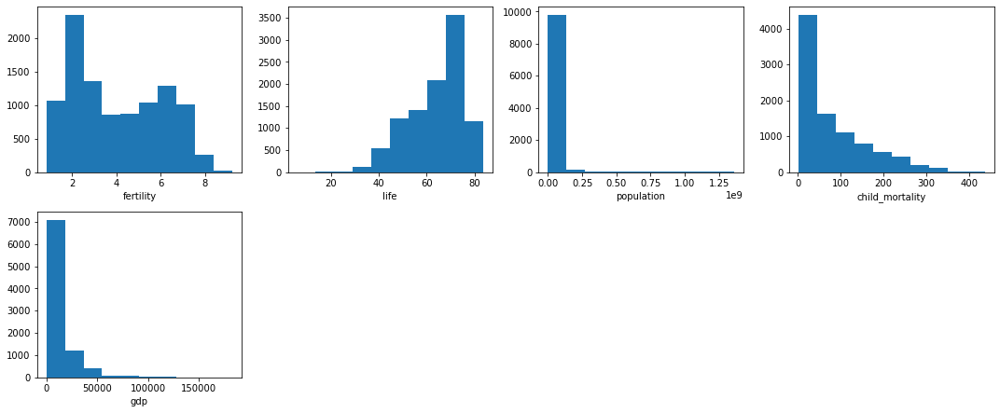

In [8]:
plt.figure(figsize=(15, 15))

for i, col in enumerate(observed_features,1):
    plt.subplot(5,4, i)
    plt.hist(x=col,data=data)
    plt.xlabel(col)
plt.tight_layout()

Filling null values with mean

In [9]:
for i in observed_features:
    data[i].fillna(data[i].mean(),inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10111 entries, 0 to 10110
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Country          10111 non-null  object 
 1   Year             10111 non-null  int64  
 2   fertility        10111 non-null  float64
 3   life             10111 non-null  float64
 4   population       10111 non-null  float64
 5   child_mortality  10111 non-null  float64
 6   gdp              10111 non-null  float64
 7   region           10111 non-null  object 
dtypes: float64(5), int64(1), object(2)
memory usage: 632.1+ KB


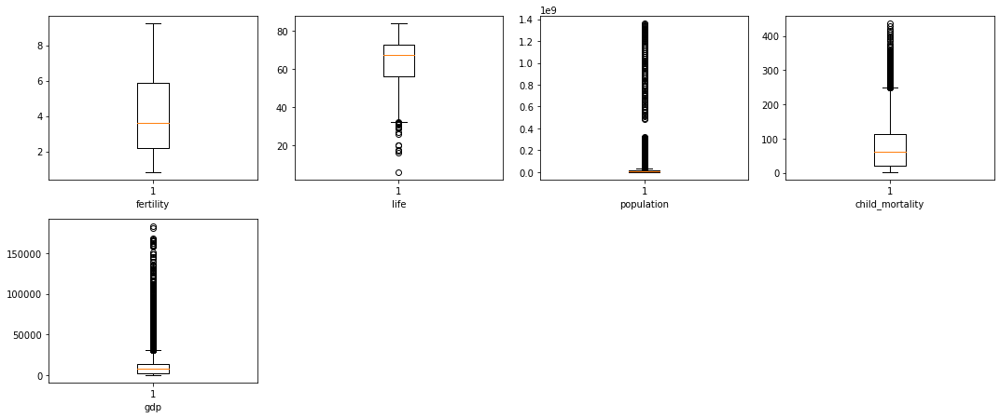

In [10]:
plt.figure(figsize=(15, 15))

for i, col in enumerate(observed_features,1):
    plt.subplot(5,4, i)
    plt.boxplot(x=col,data=data)
    plt.xlabel(col)
plt.tight_layout()

In [11]:
#plt.figure(figsize=(15, 15))
for j in data.region.unique():
    new = data[data.region == j]
    
    for col in observed_features:
        fig = px.pie(new, values=col, names='Country',title=f"pie plot of {j}'s {col} for it's countries")
        fig.show()

In [12]:
data

,Country,Year,fertility,life,population,child_mortality,gdp,region
0,Afghanistan,1964,7.671000,33.639,10474903.0,339.700000,1182.000000,South Asia
1,Afghanistan,1965,7.671000,34.152,10697983.0,334.100000,1182.000000,South Asia
2,Afghanistan,1966,7.671000,34.662,10927724.0,328.700000,1168.000000,South Asia
3,Afghanistan,1967,7.671000,35.170,11163656.0,323.300000,1173.000000,South Asia
4,Afghanistan,1968,7.671000,35.674,11411022.0,318.100000,1187.000000,South Asia
...,...,...,...,...,...,...,...,...
10106,Åland,2002,4.028719,81.800,26257.0,80.834505,12746.916667,Europe & Central Asia
10107,Åland,2003,4.028719,80.630,26347.0,80.834505,12746.916667,Europe & Central Asia
10108,Åland,2004,4.028719,79.880,26530.0,80.834505,12746.916667,Europe & Central Asia
10109,Åland,2005,4.028719,80.000,26766.0,80.834505,12746.916667,Europe & Central Asia


## Region wise analysis

Sub Saharan African region has highest fertility rate 

In [13]:
fertility = pd.DataFrame(data.groupby('region')['fertility'].mean())
fig = px.bar(fertility, x=fertility.index, y="fertility", orientation='v',title='Region Wise Fertility',width=500,height=400)
fig.show()

Sub Saharan African region has lowest life expectancy and Europe and Central Asia has highest life expectancy

In [14]:
life = pd.DataFrame(data.groupby('region')['life'].mean())
fig = px.bar(life, x=life.index, y="life", orientation='v',title='Region Wise Life Expectancy',width=500,height=400)
fig.show()

Population of South Asia very high

In [15]:
population = pd.DataFrame(data.groupby('region')['population'].mean())
fig = px.bar(population, x=population.index, y="population", orientation='v',title='Region Wise Population',width=500,height=400)
fig.show()

Child Mortality rate is high in Sub Saharan African and South Asian regions

In [16]:
mortality = pd.DataFrame(data.groupby('region')['child_mortality'].mean())
fig = px.bar(mortality, x=mortality.index, y="child_mortality", orientation='v',title='Region Wise Child Mortality',width=500,height=400)
fig.show()

GDP is very low in Sub Saharan African and South Asian regions

In [17]:
gdp = pd.DataFrame(data.groupby('region')['gdp'].mean())
fig = px.bar(gdp, x=gdp.index, y="gdp", orientation='v',title='Region Wise GDP',width=500,height=400)
fig.show()

## Numerical Feature Analysis

Checking the scatter plots of observed features

If you observe closely, you can distinguish the plots for different years. 

Child mortality and life expectancy are higly correlated.

Fertility and life expectancy are correlated

Fertility and child mortality are also correlated.

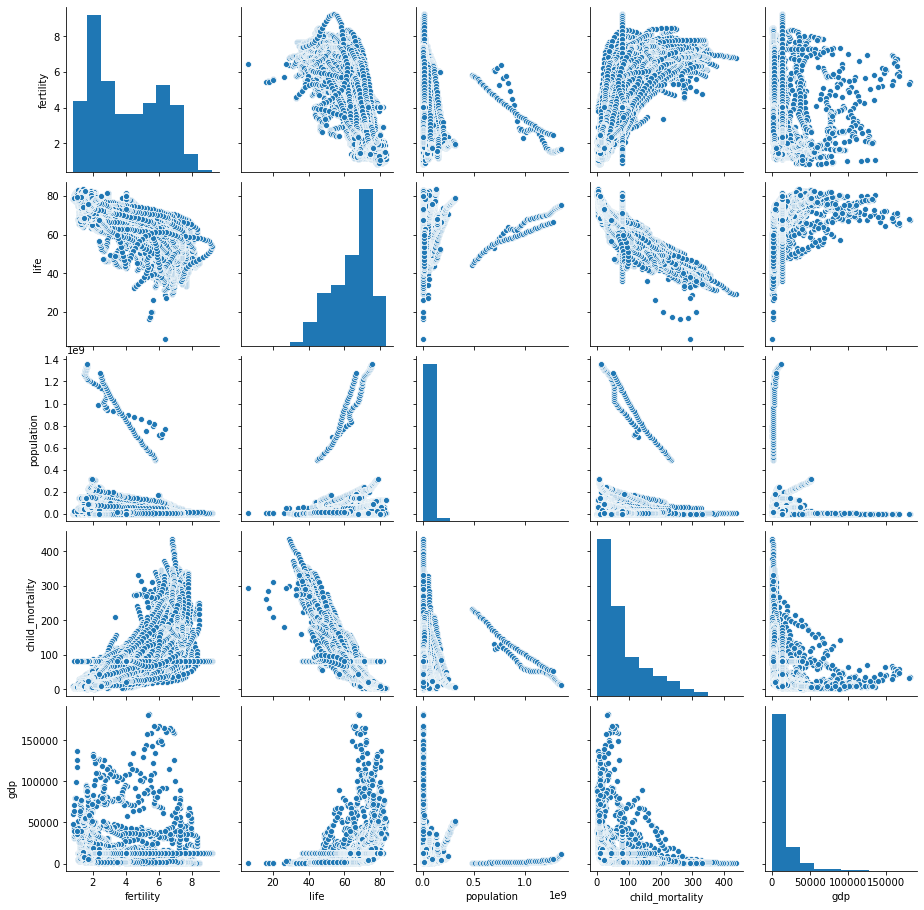

In [18]:
sns.pairplot(data[observed_features])

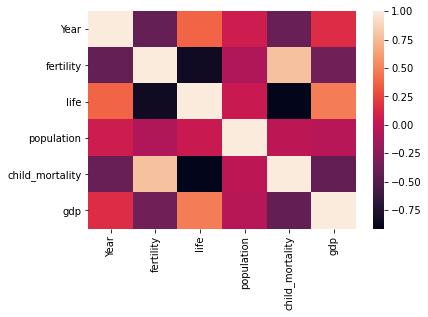

In [19]:
sns.heatmap(data.corr())

## Year Wise Analysis

Below plots give year wise trend of all the observed features for every region.

In [20]:
fig = px.bar(data, x='Year', y="fertility", orientation='v',title='Trend of fertility of all regions',width=700,height=1500,facet_row='region')
fig.show()

In [21]:
fig = px.bar(data, x='Year', y="life", orientation='v',title='Trend of life expectancy of all regions',width=700,height=1500,facet_row='region')
fig.show()

In [22]:
fig = px.bar(data, x='Year', y="population", orientation='v',title='Trend of population of all regions',width=700,height=1500,facet_row='region')
fig.show()

In [23]:
fig = px.bar(data, x='Year', y="child_mortality", orientation='v',title='Trend of child mortality of all regions',width=700,height=1500,facet_row='region')
fig.show()

In [24]:
fig = px.bar(data, x='Year', y="gdp", orientation='v',title='Trend of gdp of all regions',width=700,height=1500,facet_row='region')
fig.show()

Creating a new dataset with country name as index and mean values of all observed features

By doing this we come to know that the mean of all the countries are different. 
This is just on sample data. Later we will be doing some parametric tests to analyize on population too.

In [25]:
country = pd.DataFrame(data.groupby(['Country'])['fertility','life','population','child_mortality','gdp'].mean())
country

C:\Users\Srujan\Anaconda\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,fertility,life,population,child_mortality,gdp
Country,,,,,
Afghanistan,7.359780,47.35280,1.827204e+07,203.198000,1187.200000
Albania,3.290100,71.64512,2.817009e+06,57.443400,5012.520000
Algeria,5.065340,62.26872,2.402512e+07,106.082000,9662.180000
Angola,6.988800,42.32716,1.098218e+07,229.667800,4719.160000
Antigua and Barbuda,2.528700,70.63692,7.185468e+04,30.917800,13765.380000
...,...,...,...,...,...
Western Sahara,4.545980,54.91502,2.414180e+05,91.469642,12746.916667
"Yemen, Rep.",7.303940,53.65530,1.300170e+07,80.834505,12746.916667
Zambia,6.633800,47.73318,7.893245e+06,153.464000,2990.060000


# Finding country having minimum and maximum value for each feature

In [26]:
def max_min(col):
    maxi = country.loc[country[col] == country[col].max(),col]
    mini = country.loc[country[col] == country[col].min(),col]
    print(maxi,'\n',mini,'\n')

for i in country.columns:
    max_min(i)

Country
Niger    7.62402
Name: fertility, dtype: float64 
 Country
Germany    1.55526
Name: fertility, dtype: float64 

Country
Åland    80.139
Name: life, dtype: float64 
 Country
Sierra Leone    38.6805
Name: life, dtype: float64 

Country
China    1.089139e+09
Name: population, dtype: float64 
 Country
Tokelau    1170.0
Name: population, dtype: float64 

Country
Mali    276.596
Name: child_mortality, dtype: float64 
 Country
Sweden    7.57
Name: child_mortality, dtype: float64 

Country
Qatar    110391.56
Name: gdp, dtype: float64 
 Country
Malawi    600.96
Name: gdp, dtype: float64 



# one way ANOVA 

In [27]:
import statsmodels.api as sm 
from statsmodels.formula.api import ols

p value is 0, which is less than 0.05(alpha). Now we can reject the null hypothesis(which states that all the country's mean fertility are equal) and conclude that the means are different.

In [28]:
lm = ols('fertility ~ Country',data = data).fit()
table = sm.stats.anova_lm(lm)
print(table)

              df        sum_sq     mean_sq           F  PR(>F)
Country    203.0  29812.391198  146.859070  130.489463     0.0
Residual  9907.0  11149.810635    1.125448         NaN     NaN


Let us do it for all the observed features

You can notice that p value is 0 for all the tests This implies that 0 value is very small and is rounded off to 0.

In [29]:
lm = ols('life ~ Country',data = data).fit()
table = sm.stats.anova_lm(lm)
print(table)

              df         sum_sq      mean_sq           F  PR(>F)
Country    203.0  984058.455615  4847.578599  180.062753     0.0
Residual  9907.0  266712.356765    26.921607         NaN     NaN


In [30]:
lm = ols('population ~ Country',data = data).fit()
table = sm.stats.anova_lm(lm)
print(table)

              df        sum_sq       mean_sq           F  PR(>F)
Country    203.0  1.021140e+20  5.030246e+17  888.650695     0.0
Residual  9907.0  5.607900e+18  5.660544e+14         NaN     NaN


In [31]:
lm = ols('child_mortality ~ Country',data = data).fit()
table = sm.stats.anova_lm(lm)
print(table)

              df        sum_sq        mean_sq           F  PR(>F)
Country    203.0  4.161793e+07  205014.456213  125.550663     0.0
Residual  9907.0  1.617736e+07    1632.922126         NaN     NaN


In [32]:
lm = ols('gdp ~ Country',data = data).fit()
table = sm.stats.anova_lm(lm)
print(table)

              df        sum_sq       mean_sq           F  PR(>F)
Country    203.0  2.353405e+12  1.159313e+10  231.029296     0.0
Residual  9907.0  4.971366e+11  5.018034e+07         NaN     NaN
